# <center><font color='red'>Projet modèle de prévision : Prévision des quantités vendues d'une boulangerie avec optimisation de la prévision</font></center>
---


# 1. Description du problème de machine learning
---

Dans le cadre du cours de Modèles de prévisions et Deep Learning enseigné par Mr Guillaume Hochard,  nous avons ainsi choisi de réaliser **un modèle de prévision des quantités journalières vendues au sein d'une boulangerie française**.
En ce sens notre problème de machine learning est  : un enjeu de forecast des quantités journalières vendue  au sein de la boulangerie.

## 2. Présentation du jeu de données
---

Notre jeu de données provient d'une boulangerie française, elle contient des informations sur les transactions quotidiennes effectuées par les clients sur une période de près de deux ans, débutant le 1er janvier 2021 et se terminant le 30 septembre 2022.

Plus spécifiquement, Le jeu de données contient 234005 entrées, plus de 136000 transactions et 6 colonnes qui sont respectivement : 
- 'date' : date de la transaction
- 'time' : heure de la transaction
- 'ticket_number' : ticket d'identification unique de la transaction
- 'article' : nom de l'article acheté
- 'quantity' : quantité acheté
- 'unit_price' : prix unitaire par article

In [1]:
pip install pmdarima

In [1]:
# Import des librairies standards

# Librairies pour le traitement des données
import pandas as pd  
import re
import datetime as dt


# Librairies pour la visualisation
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px 
import plotly.subplots as sp
import plotly.graph_objects as go


# Librairie pour la modélisation et l'analyse statistique
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error
import math
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_percentage_error
from pmdarima import auto_arima
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from scipy.stats import kendalltau
from fbprophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly
from prophet.diagnostics import performance_metrics


# Librairie pour la gestion des warnings
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Lecture de la base de données
df_bakery = pd.read_csv(r'projet_boulangerie.csv', sep=';')

##  3. Analyse exploratoire des données 
---

In [3]:
# Affichage de la base de données
df_bakery.head(5)

,Unnamed: 0,date,time,ticket_number,article,Quantity,unit_price
0,0,02/01/2021,08:38,150040.0,BAGUETTE,1.0,"0,90 €"
1,1,02/01/2021,08:38,150040.0,PAIN AU CHOCOLAT,3.0,"1,20 €"
2,4,02/01/2021,09:14,150041.0,PAIN AU CHOCOLAT,2.0,"1,20 €"
3,5,02/01/2021,09:14,150041.0,PAIN,1.0,"1,15 €"
4,8,02/01/2021,09:25,150042.0,TRADITIONAL BAGUETTE,5.0,"1,20 €"


In [4]:
# On supprime la colonne Unnamed
df_bakery.drop(columns='Unnamed: 0',inplace=True)

In [5]:
# Uniformisation du nom des colonnes
df_bakery.columns = df_bakery.columns.str.lower()

In [6]:
# Affichage des dimensions de la base 
print(f"Notre base de données contient : " + str(df_bakery.shape[0]) + " observations et " + str(df_bakery.shape[1]) + " variables.")

Notre base de données contient : 234005 observations et 6 variables.


## 3.1. Data cleaning
---

In [7]:
# Ajustement de la base de données
df_bakery['unit_price'] = df_bakery['unit_price'].apply(lambda x: re.sub(r'€', '', x))
df_bakery['unit_price'] = df_bakery['unit_price'].str.replace(',', '.')

In [8]:
# Harmonisation des formats d'article dans la base de données
df_bakery = df_bakery[df_bakery['article'] != '.']

In [9]:
# Affichage des types des variables
df_bakery.dtypes

date              object
time              object
ticket_number    float64
article           object
quantity         float64
unit_price        object
dtype: object

In [10]:
# Changement du type des variables
df_bakery['date'] = pd.to_datetime(df_bakery['date'])
df_bakery['time'] = pd.to_datetime(df_bakery['time'])
df_bakery['time'] = df_bakery['time'].dt.time
df_bakery['ticket_number'] = df_bakery['ticket_number'].astype('object')
df_bakery['unit_price'] = df_bakery['unit_price'].astype('float')
df_bakery["quantity"] = df_bakery["quantity"].astype("int")

In [11]:
# Vérification des changements de type
df_bakery.dtypes

date             datetime64[ns]
time                     object
ticket_number            object
article                  object
quantity                  int32
unit_price              float64
dtype: object

In [12]:
# Vérification du nombre d'articles uniques
print(f"Notre base de données contient : " + str(df_bakery['article'].nunique()) + " articles distincts.")

Notre base de données contient : 148 articles distincts.


In [13]:
# Vérification de l'existence des valeurs manquantes 
print(f"Notre base de données contient : " + str(df_bakery.isnull().sum().sum()) + " valeurs manquantes.")

Notre base de données contient : 0 valeurs manquantes.


In [14]:
# Vérification de l'existence de doublons dans la base de données
print(f"Notre base de données contient : " + str(df_bakery.duplicated().sum().sum()) + " doublons.")

Notre base de données contient : 1210 doublons.


In [15]:
# Affichage des doublons de la base 
df_bakery[df_bakery.duplicated(keep=False)].head()

,date,time,ticket_number,article,quantity,unit_price
34,2021-02-01,10:12:00,150061.0,COUPE,1,0.15
36,2021-02-01,10:12:00,150061.0,COUPE,1,0.15
40,2021-02-01,10:18:00,150063.0,COUPE,1,0.15
43,2021-02-01,10:18:00,150063.0,COUPE,1,0.15
218,2021-02-01,12:23:00,150154.0,TRADITIONAL BAGUETTE,1,1.20


In [16]:
# Suppression des doublons présents dans la base de données
df_bakery.drop_duplicates(inplace=True)

In [17]:
# Vérification de la suppression des doublons
print(f"Notre base de données contient : " + str(df_bakery.duplicated().sum().sum()) + " doublons.")

Notre base de données contient : 0 doublons.


In [18]:
# Vérification des quantités vendues
df_bakery[df_bakery['quantity']<0]

,date,time,ticket_number,article,quantity,unit_price
448,2021-03-01,10:41:00,150265.0,BAGUETTE,-1,0.90
1162,2021-05-01,19:00:00,150738.0,SPECIAL BREAD,-1,2.40
1163,2021-05-01,19:00:00,150738.0,DIVERS PATISSERIE,-1,6.00
1164,2021-05-01,19:00:00,150738.0,DIVERS BOULANGERIE,-1,2.00
1467,2021-08-01,11:58:00,150941.0,COUPE,-1,0.15
...,...,...,...,...,...,...
233054,2022-09-27,18:03:00,288312.0,COUPE,-2,0.15
233055,2022-09-27,18:03:00,288312.0,TRADITIONAL BAGUETTE,-1,1.30
233056,2022-09-27,18:03:00,288312.0,CEREAL BAGUETTE,-3,1.35
233553,2022-09-29,11:55:00,288639.0,BOISSON 33CL,-1,1.50


On constate que notre base de données contient des quantités vendues négatives, cela pourrait correspondre à deux cas de figures  :
- Une remise effectuée par la boulangerie 
- Une erreur de saisie au niveau de l'encaissement

Faute d'assez de connaissance précise sur le contexte de ces quantités vendues négatives, nous allons procéder à la suppression de tous les tickets de caisses contenant une quantité vendue négative.

In [19]:
# Suppression des quantités négatives
df_bakery = df_bakery.drop(df_bakery[df_bakery['quantity'] < 0].index)

In [20]:
# Résumé statistique de la base de données
df_bakery.describe()

,quantity,unit_price
count,231506.000000,231506.000000
mean,1.559048,1.664332
std,1.200421,1.717384
min,1.000000,0.000000
25%,1.000000,1.100000
50%,1.000000,1.200000
75%,2.000000,1.500000
max,200.000000,60.000000


 A traver le résumé statisque, on peut voir que la **quantité maximum vendue est 200**. Cette quantité nous paraît intriguante en ce sens, comme nous pouvons le voir ci-desssous l'article concernée par cette vente est :  **'CAFE OU EAU'**, nous allons donc procéder à la **suppression de cet outlier**.

In [21]:
# Suppression de l'outlier 
df_bakery = df_bakery.drop(df_bakery[df_bakery['quantity']>101].index)

### 3.2. Feature Engineering
---
Afin de **mieux saisir les habitudes de consommation des clients de notre boulangerie**, il nous a paru pertinent de créer de nouvelles variables afin d'enrichir notre base de données.

Tout d'abord nous avons choisi d'ajouter une variable nommée **total_amount_spent** qui correspond au **montant total dépensé pour une transaction** en se basant sur les quantités et le prix unitaire des articles achetées. Cette variable nous permettra de mieux appréhender les montants dépensées au sein de la boulangerie.

Ensuite, nous avons ajouté plusieurs variables liée à **la temporalité des ventes** en extrayant des variables initiales (dates et time) les informations suivantes :
- **'year'** correspondant à l'année de la vente
- **'month'** correspondant au mois de la vente
- **'day_of_week'** corrspondant au jour de la semaine où la vente a été réalisé
- **'day_time_of_purchase'** correspondant à la plage horaire où la vente a été réalisée (ie [9,10) lorsque la commande a été passée à 9h38) 
Ces variables de temporalité nous permettront d'apprécier les comportements de vente des clients et de capter les différentes temporalités.

Enfin, il nous a paru pertinent d'ajouter une variable binaire nommée **'holiday' qui prend la valeur 1 lorsque la vente a été réalisée lors d'une période de vacances scolaires et 0 si celle-ci a été réalisée hors vacances scolaires**. Pour créer cette variable, nous nous basons sur les périodes de vacances scolaires à Paris en 2021 et 2022 qui sont respectivement :
- Rentrée 2020 : mardi 1er septembre 2020.
- Vacances de la Toussaint : du samedi 17 octobre au dimanche 1er novembre 2020.
- Vacances de Noël : du samedi 19 décembre 2020 au dimanche 3 janvier 2021.
- Vacances d’hiver : du 13 février 2021 au 28 février 2021
- Vacances de printemps : du 17 avril au 2 mai pour la zone C.
- Vacances d’été : fin des cours le mardi 6 juillet 2021 au 2 septembre 2021
- Rentrée scolaire 2021	Jour de reprise : jeudi 2 septembre 2021
- Toussaint 2021 est du samedi 23 octobre au lundi 8 novembre 2021
- Noël 2021 est du samedi 18 décembre 2021 au lundi 3 janvier 2022
- Hiver 2022 est du  du samedi 19 février au lundi 7 mars 2022
- Printemps 2022 (Pâques) est du samedi 23 avril au lundi 9 mai 2022
- Été 2022 (grandes vacances) est du  du jeudi 7 juillet au jeudi 1er septembre 2022

In [22]:
# Création de la variable 'total_amount_spent'
df_bakery['total_amount_spent'] = df_bakery['quantity'] * df_bakery['unit_price']

In [23]:
# Création de la variable jour de la semaine
df_bakery['day_of_week'] = df_bakery['date'].dt.dayofweek
df_bakery["day_of_week"]=df_bakery["day_of_week"].replace((0,1,2,3,4,5,6),('Lundi','Mardi' ,'Mercredi' ,'Jeudi','Vendredi' ,'Samedi' ,'Dimanche'))

In [24]:
# Création de la variable 'année'
df_bakery['year'] = df_bakery['date'].dt.year

In [25]:
# Création de la variable 'mois'
df_bakery['month'] = df_bakery['date'].dt.month
df_bakery["month"]=df_bakery["month"].replace((1,2,3,4,5,6,7,8,9,10,11,12),('Janvier','Fevrier' ,'Mars' ,'Avril' ,'Mai' ,'Juin' ,'Juillet' ,'Aout' ,'Septembre','Octobre' ,'Novembre' ,'Décembre' ))

In [26]:
# Définition de la période de vacances scolaires
holidays = pd.date_range(start='2020-09-01', end='2020-09-01').union(
           pd.date_range(start='2020-10-17', end='2020-11-01')).union(
           pd.date_range(start='2020-12-19', end='2021-01-03')).union(
           pd.date_range(start='2021-02-13', end='2021-02-28')).union(
           pd.date_range(start='2021-04-17', end='2021-05-02')).union(
           pd.date_range(start='2021-07-07', end='2021-09-01')).union(
           pd.date_range(start='2021-10-23', end='2021-11-08')).union(
           pd.date_range(start='2021-12-18', end='2022-01-03')).union(
           pd.date_range(start='2022-02-20', end='2022-03-07')).union(
           pd.date_range(start='2022-04-24', end='2022-05-09')).union(
           pd.date_range(start='2022-05-25', end='2022-05-30')).union(
           pd.date_range(start='2022-07-07', end='2022-09-01'))


# Création de la variable binaire 'Holiday'
df_bakery['holiday'] = df_bakery['date'].isin(holidays).astype(int)


In [27]:
# Création de la variable 'day_time_of_purchase'
df_bakery['time'] = pd.to_datetime(df_bakery['time'], format='%H:%M:%S')
df_bakery['day_time_of_purchase'] = pd.cut(df_bakery['time'].dt.hour,
                                           bins=range(0, 25),
                                           labels=['[{0:02d}-{1:02d})'.format(i, i+1) for i in range(0, 24)],
                                           include_lowest=True)


In [28]:
# Affichage de la base de données finales
df_bakery.head()

,date,time,ticket_number,article,quantity,unit_price,total_amount_spent,day_of_week,year,month,holiday,day_time_of_purchase
0,2021-02-01,1900-01-01 08:38:00,150040.0,BAGUETTE,1,0.90,0.90,Lundi,2021,Fevrier,0,[07-08)
1,2021-02-01,1900-01-01 08:38:00,150040.0,PAIN AU CHOCOLAT,3,1.20,3.60,Lundi,2021,Fevrier,0,[07-08)
2,2021-02-01,1900-01-01 09:14:00,150041.0,PAIN AU CHOCOLAT,2,1.20,2.40,Lundi,2021,Fevrier,0,[08-09)
3,2021-02-01,1900-01-01 09:14:00,150041.0,PAIN,1,1.15,1.15,Lundi,2021,Fevrier,0,[08-09)
4,2021-02-01,1900-01-01 09:25:00,150042.0,TRADITIONAL BAGUETTE,5,1.20,6.00,Lundi,2021,Fevrier,0,[08-09)


## 3.2. A la recherche des insights au sein de notre boulangerie
---

Afin de mieux comprendre notre jeu de données et anticiper les différentes tendances de consommation des clients de notre boulangerie, nous avons choisi de tourner notre analyse exploratoire des enjeux vers la connaissance des articles phares de la boulangerie mais également vers l'évolution des ventes de la boulangerie. Ces informations nous permettront d'identifier les facteurs explicatifs de la quantité vendue de notre boulangerie, sujet de notre modèle prédictif qui sera mis en place dans la section suivante.

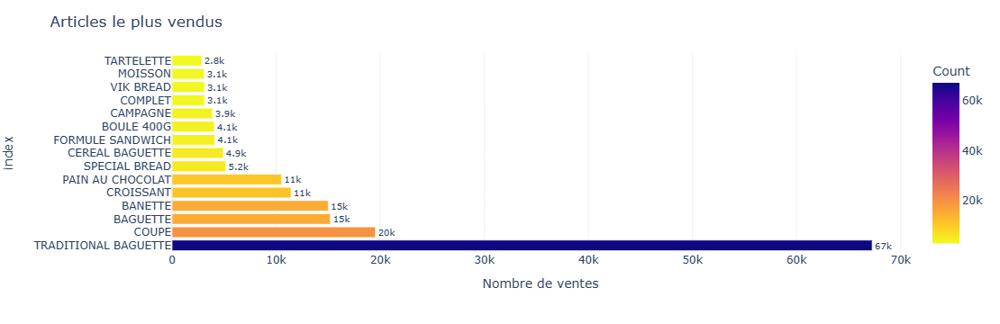

In [29]:
# Graphique des articles les plus vendus
eda_article = df_bakery["article"].value_counts().head(15).reset_index(name="Count")
fig = px.bar(eda_article, x='Count', y='index', text='Count', color='Count',
           color_continuous_scale=px.colors.sequential.Plasma_r)
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(title='Articles le plus vendus', xaxis_title='Nombre de ventes',
                  yaxis_title='index', showlegend=False, template='plotly_white')
fig.show()

Parmi les articles les plus vendus au sein de la boulangerie, **en emblème de la consommation française** on retrouve **la baguette tradition** qui **monopolise les ventes de la boulangerie**. On retrouve dans le **top 5** : la baguette, la banette, la coupe et le croissant qui concurrence ensemble la primatie de notre baguette tradition nationale.

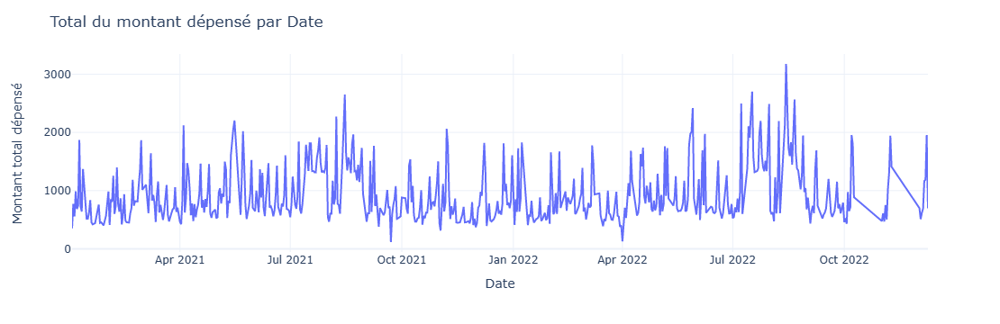

In [30]:
## Graphique du total montant dépensés par date 
df_total_spent = df_bakery.groupby('date')['total_amount_spent'].sum().reset_index()
fig = px.line(df_total_spent, x='date', y='total_amount_spent')
fig.update_layout(title_text='Total du montant dépensé par Date', xaxis_title='Date', yaxis_title='Montant total dépensé', template='plotly_white')
fig.show()

A travers ce graphique de l'évolution des montants dépensées au sein de la boulangerie entre 2021 et 2022, on peut voir que **de plus gros montant ont été dépensé en 2022 en comparaison à 2021 même si on peut détecter une certaine tendance et saisonnalité dans les montants dépensés**. On pourra ainsi décomposer notre série en tendance et saisonnalité.

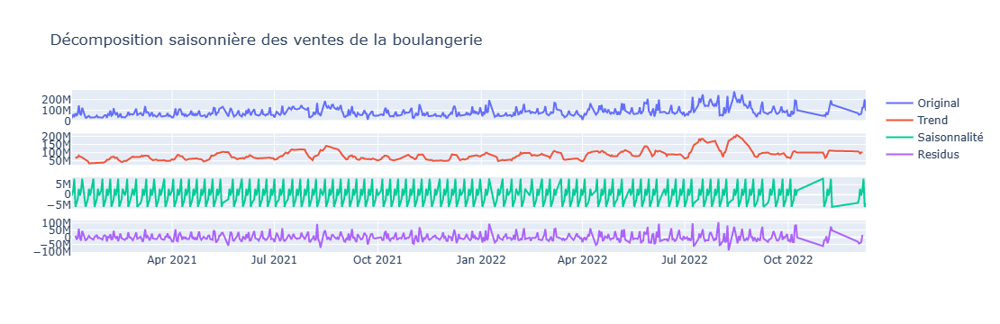

In [31]:
# Décomposition saisonnière des ventes de la boulangerie
series = df_bakery.groupby('date')['ticket_number'].sum().reset_index()
series['date'] = pd.to_datetime(series['date'])
series = series.set_index('date')['ticket_number']

# Décomposition Saisonnière
decomposition = sm.tsa.seasonal_decompose(series, model='additive', period=7)

# Extraction des composantes de la série
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

# Création de subplots
fig = sp.make_subplots(rows=4, cols=1, shared_xaxes=True)

# Tracé des différentes séries
fig.add_trace(go.Scatter(x=series.index, y=series.values, mode='lines', name='Original'), row=1, col=1)
fig.add_trace(go.Scatter(x=trend.index, y=trend.values, mode='lines', name='Trend'), row=2, col=1)
fig.add_trace(go.Scatter(x=seasonal.index, y=seasonal.values, mode='lines', name='Saisonnalité'), row=3, col=1)
fig.add_trace(go.Scatter(x=residual.index, y=residual.values, mode='lines', name='Residus'), row=4, col=1)

# Ajout du titre 
layout = go.Layout(title='Décomposition saisonnière des ventes de la boulangerie')
fig.update_layout(layout)

# Affichage du graphique
fig.show()

A travers ce graphique qui représente la décomposition saisonnière des ventes au sein de la boulangerie, on peut distinguer 3 grands phénomènes : 
- Notre série comporte **une tendance claire haussière et baissière** selon la période de l'année considérée ce qui témoigne des **variations des ventes au sein de la boulangerie**.
- **La saisonnalité influe majoritairement à la hausse sur les ventes de la boulangerie**.
- La **composante résiduelle n'a pas un efet majeur sur les ventes de notre série** car elle est toujours en moyenne à 0 sauf quelques **pics en Septembre 2021 et Septembre 2022**.


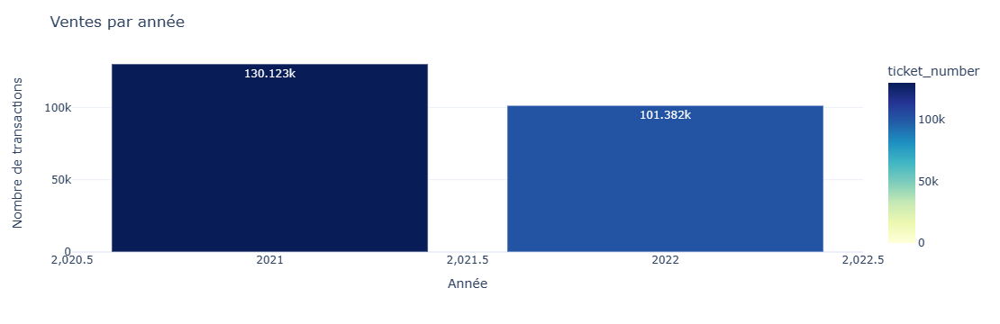

In [32]:
# Graphique du nombre de ventes par années
datayears=df_bakery.groupby("year")["ticket_number"].count().reset_index()
fig = px.bar(datayears, x="year", y="ticket_number", color="ticket_number",
             color_continuous_scale="YlGnBu", color_continuous_midpoint=max(datayears["ticket_number"])/2)
fig.update_traces(texttemplate='%{y}', textposition='inside')
fig.update_layout(title_text='Ventes par année', xaxis_title='Année', yaxis_title='Nombre de transactions', template='plotly_white')
fig.show()


On peut voir à l'aide du graphique ci-dessus que **la boulangerie à réalisé le plus de ventes en 2021 avec 131 420 ventes** en comparaison avec **l'année 2022 où ce nombre de vente baisse de 22%**.

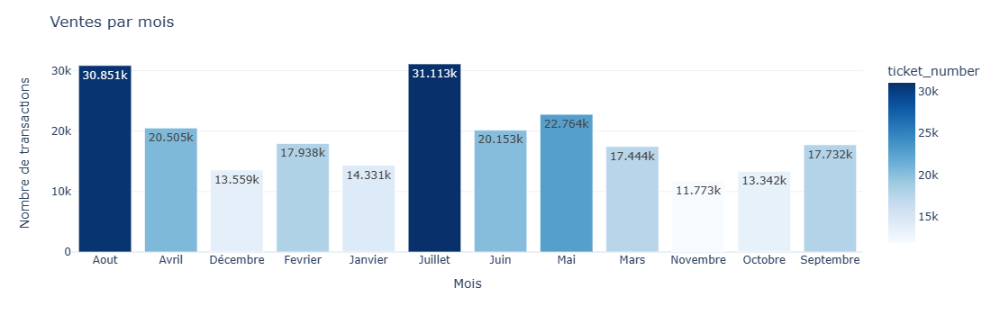

In [33]:
## Graphique du nombre de transaction par mois

datamonth = df_bakery.groupby("month")["ticket_number"].count().reset_index()

fig = px.bar(datamonth, x="month", y="ticket_number", color="ticket_number", 
             color_continuous_scale="Blues")
fig.update_traces(texttemplate='%{y}', textposition='inside')
fig.update_layout(title_text='Ventes par mois', xaxis_title='Mois',
                  yaxis_title='Nombre de transactions', template='plotly_white')
fig.show()

A travers le graphique ci-dessus, on remarque que **la boulangerie vend ses plus grandes quantités durant la période estivale à savoir au mois de Juillet et Août** surêment car **c'est une période où la France accueille le plus de touristes** ainsi cette période permet à la boulangerie de vendre en plus grande quantité que le reste de l'année.

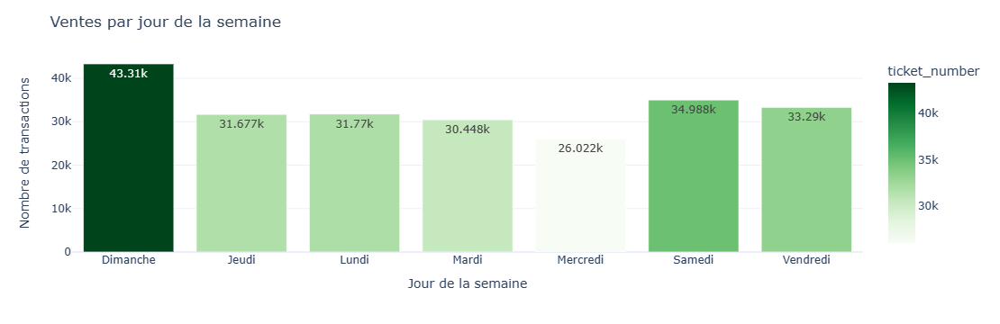

In [34]:
## Graphique du nombre de transaction par jour de la semaine 
dataweek=df_bakery.groupby("day_of_week")["ticket_number"].count().reset_index()

fig = px.bar(dataweek, x="day_of_week", y="ticket_number",color="ticket_number",color_continuous_scale="greens")
fig.update_traces(texttemplate='%{y}', textposition='inside')
fig.update_layout(title_text='Ventes par jour de la semaine', xaxis_title='Jour de la semaine', yaxis_title='Nombre de transactions', template='plotly_white')
fig.show()

A travers ce graphique, nous pouvons constater que **le plus gros des ventes au sein de notre boulangerie sont réalisées du vendredi au dimanche avec le dimanche comme jour clé de vente**.

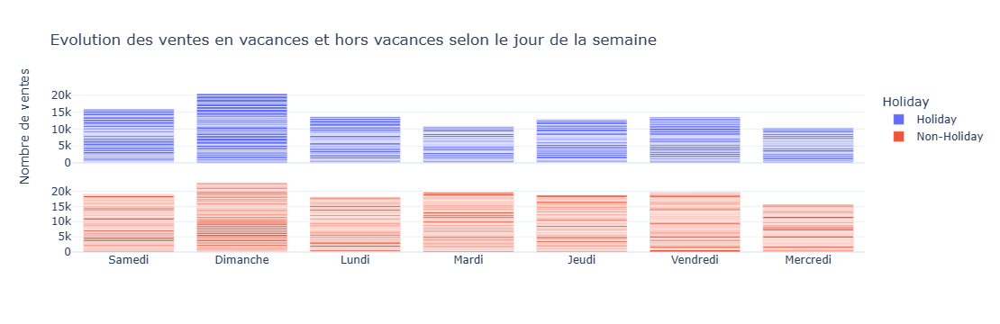

In [35]:
# Graphique des ventes journalières en fonction des périodes de vacances scolaires et hors vacances scolaires

# On regroupe les données selon la date, les vacances scolaires et le jour de la semaine
df_plot = df_bakery.groupby(['date', 'holiday', 'day_of_week']).size().reset_index(name='count')

# On divise les données selon si elles ont eu lieu durant une période de vacances scolaires ou non 
df_holiday = df_plot[df_plot['holiday'] == True]
df_no_holiday = df_plot[df_plot['holiday'] == False]

# Création de subplots pour les graphiques
fig = sp.make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.1)

# Ajout du graphique des ventes durant la période de vacances scoalires 
fig.add_trace(
    go.Bar(x=df_holiday['day_of_week'], y=df_holiday['count'], name='Holiday'),
    row=1, col=1
)

# Ajout du graphique des ventes durant la période hors vacances scolaires
fig.add_trace(
    go.Bar(x=df_no_holiday['day_of_week'], y=df_no_holiday['count'], name='Non-Holiday'),
    row=2, col=1
)

# Paramétrisation du graphique : ajout de titres et de légende
fig.update_layout(title='Evolution des ventes en vacances et hors vacances selon le jour de la semaine',
                  legend_title='Holiday',
                  yaxis=dict(title='Nombre de ventes'), template='plotly_white')


# Affichage du graphique
fig.show()


A travers ce graphique, nous pouvons détecter des tendances dans le comportement des clients selon que nous nous positionnons en  périodes de vacances ou non :
* Les **ventes sont plus importantes lors des périodes de vacances** car on peut voir que plus de 15.000 ventes sont réalisées en moyenne.
* On constate que indistinctement de la période concernée, le **nombre maximal des ventes sont réalisées le dimanche**
* Hors vacances scolaires, **en fin de semaine le nombre de ventes réalisées augmentent** respectivement le jeudi et le vendredi comparées au reste du début de semaine.

# 3.3. Création de la variable cible : quantité journalière vendue (daily_sold_quantity)
---

Le but principal de notre projet est la **quantité journalière vendue**  au sein de la boulangerie. Toutefois, cette variable n'existe pas dans notre base de données, il nous faut de ce fait la créer sur la base des variables 'quantity' et 'date' donnant les quantités unitaires vendues ne donnant pas la dimension totale que nous recherchons.

In [36]:
# Création de la variable cible
df_bakery['daily_quantity_sold'] = df_bakery.groupby('date')['quantity'].transform('sum')

In [38]:
# Affichage de la base 
df_bakery.head()

,date,time,ticket_number,article,quantity,unit_price,total_amount_spent,day_of_week,year,month,holiday,day_time_of_purchase,daily_quantity_sold
0,2021-02-01,1900-01-01 08:38:00,150040.0,BAGUETTE,1,0.90,0.90,Lundi,2021,Fevrier,0,[07-08),574
1,2021-02-01,1900-01-01 08:38:00,150040.0,PAIN AU CHOCOLAT,3,1.20,3.60,Lundi,2021,Fevrier,0,[07-08),574
2,2021-02-01,1900-01-01 09:14:00,150041.0,PAIN AU CHOCOLAT,2,1.20,2.40,Lundi,2021,Fevrier,0,[08-09),574
3,2021-02-01,1900-01-01 09:14:00,150041.0,PAIN,1,1.15,1.15,Lundi,2021,Fevrier,0,[08-09),574
4,2021-02-01,1900-01-01 09:25:00,150042.0,TRADITIONAL BAGUETTE,5,1.20,6.00,Lundi,2021,Fevrier,0,[08-09),574


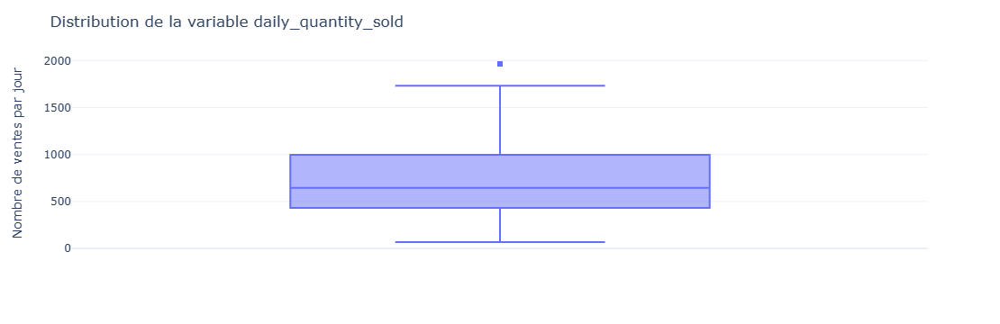

In [39]:
# Distribution de la variable cible 
fig = px.box(df_bakery, y='daily_quantity_sold')
fig.update_layout(title='Distribution de la variable daily_quantity_sold',
                  yaxis=dict(title='Nombre de ventes par jour'), template='plotly_white')
fig.show()

# 4. Préparation des données pour être fournies à l'algorithme de ML/DL
---

### 4.1. Traitement

In [40]:
# Création de la variable des montaux totaux journaliers dépensés à la boulangerie
df_bakery['daily_total_amount_spent']= df_bakery.groupby('date')['total_amount_spent'].transform('sum')

In [41]:
# Création de la base de modélisation 
df_modelisation = df_bakery.groupby('date').agg({'daily_quantity_sold': 'sum', 'holiday': 'first', 'daily_total_amount_spent':'sum'}).reset_index()
# Nous allons limiter notre dataframe à la date que nous avions au depart (2022-09-30) car l'aggrefation créer des dates en plus
last_date='2022-09-30'
df_modelisation = df_modelisation[df_modelisation["date"] <= last_date]
# On met la date en index
df_modelisation.set_index('date', inplace = True)

In [42]:
# Affichage de la base de modélisation 
df_modelisation.head()

,daily_quantity_sold,holiday,daily_total_amount_spent
date,,,
2021-01-02,43380,1,63612.00
2021-01-03,189312,1,268290.60
2021-01-04,97090,0,148667.40
2021-01-05,277123,0,408395.05
2021-01-06,121716,0,201301.80


In [43]:
# Vérification des types des variables dans la base de modélisation
df_modelisation.dtypes

daily_quantity_sold           int32
holiday                       int32
daily_total_amount_spent    float64
dtype: object

### 4.2. Train/Test/Split

In [44]:
# Séparation des données en échantillon de train et de test
train_gb = df_modelisation[:int(0.7*len(df_modelisation))]
test_gb = df_modelisation[int(0.7*len(df_modelisation)):]

In [45]:
# Dimensions des échantillons de train et de test
print(f" La dimension de la base d'apprentissage pour Gradient Boosting est : " + str(train_gb.shape))
print(f" La dimension de la base de test pour Gradient Boosting est  : " + str(test_gb.shape))

 La dimension de la base d'apprentissage pour Gradient Boosting est : (401, 3)
 La dimension de la base de test pour Gradient Boosting est  : (173, 3)


In [46]:
# Séparation des features et de la variable cible
X_train_gb = train_gb.drop(columns='daily_quantity_sold')
y_train = train_gb['daily_quantity_sold']
X_test_gb = test_gb.drop(columns='daily_quantity_sold')
y_test = test_gb['daily_quantity_sold']

### 4.3. Préparation spécifique au SARIMAX

In [47]:
# Création de la base pour la modelisation SARIMAX
df_modelisation_sarima = df_bakery.groupby('date')["daily_quantity_sold"].sum().reset_index()
#Nous allons limiter notre dataframe à la date que nous avions au depart (2022-09-30) car l'aggrefation créer des dates en plus
last_date='2022-09-30'
df_modelisation_sarima = df_modelisation_sarima[df_modelisation_sarima["date"] <= last_date]
# On met la date en index
df_modelisation_sarima.set_index('date', inplace=True)

In [48]:
# Séparation des données en échantillon de train et de test
train_sarima = df_modelisation_sarima[:int(0.7*len(df_modelisation_sarima))]
test_sarima = df_modelisation_sarima[int(0.7*len(df_modelisation_sarima)):]

In [49]:
# Dimensions des échantillons de train et de test
print(f" La dimension de la base d'apprentissage pour SARIMAX est : " + str(train_sarima.shape))
print(f" La dimension de la base de test pour SARIMAX est  : " + str(test_sarima.shape))

 La dimension de la base d'apprentissage pour SARIMAX est : (401, 1)
 La dimension de la base de test pour SARIMAX est  : (173, 1)


In [50]:
# Affichage de la base de modélisation 
train_sarima.head()

,daily_quantity_sold
date,
2021-01-02,43380
2021-01-03,189312
2021-01-04,97090
2021-01-05,277123
2021-01-06,121716


#### A) Tests de stationnarité

In [53]:
# Test de stationnarité de Dickey Fuller (ADF) sur la variable cible "daily_quantity_sold"
print(f'ADF test pour daily_quantity_sold:')
result = sm.tsa.stattools.adfuller(df_modelisation_sarima["daily_quantity_sold"])
print(f'ADF statistique: {result[0]}')
print(f'p-value: {result[1]}')

if result[1] < 0.05:
    print("L'hypothèse nulle de non stationnarité a été rejetée.")
else:
    print("L'hypothèse nulle de non stationnarité ne peut pas etre rejeté. ")
print('')

ADF test pour daily_quantity_sold:
ADF statistique: -5.015334971045231
p-value: 2.069339994281427e-05
L'hypothèse nulle de non stationnarité a été rejetée.



In [54]:
# Test de stationnarité de KPSS sur la variable cible "daily_quantity_sold"
print(f'KPSS test pour daily_quantity_sold:')
result = sm.tsa.stattools.kpss(df_modelisation_sarima["daily_quantity_sold"])
print(f'KPSS statistique: {result[0]}')
print(f'p-value: {result[1]}')

if result[1] < 0.05:
    print("L'hypothèse nulle de non stationnarité a été rejetée.")
else:
    print("L'hypothèse nulle de non stationnarité ne peut pas etre rejeté. ")
print('')

KPSS test pour daily_quantity_sold:
KPSS statistique: 0.23155021306368267
p-value: 0.1
L'hypothèse nulle de non stationnarité ne peut pas etre rejeté. 



In [55]:
# Test de stationnarité de PP sur la variable cible "daily_quantity_sold"
print(f'PP test pour daily_quantity_sold:')
result = sm.tsa.stattools.adfuller(df_modelisation_sarima["daily_quantity_sold"], regression='ct')
print(f'PP statistique: {result[0]}')
print(f'p-value: {result[1]}')

if result[1] < 0.05:
    print("L'hypothèse nulle de non stationnarité a été rejetée.")
else:
    print("L'hypothèse nulle de non stationnarité ne peut pas etre rejeté. ")
print('')

PP test pour daily_quantity_sold:
PP statistique: -5.06048906070293
p-value: 0.00015942092137829337
L'hypothèse nulle de non stationnarité a été rejetée.



On constate que **2 tests statistiques sur 3 confirment la stationnarité de notre variable cible**, ainsi on peut la modéliser avec un modèle SARIMA sans que nos résultats ne soient biaiser.

#### B) Autocorrélation et Autocorrélation partielle

Afin de déterminer les ordres de variables passées à retenir pour expliquer la quantité journalière vendue au sein de la boulangerie, on se sert de l'autocorrélation partielle.

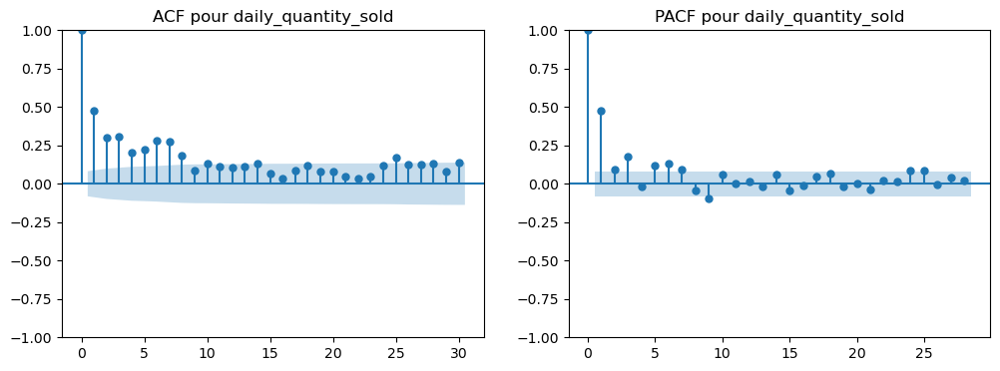

In [56]:
# Configuration des subplots
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

# Graphique ACF
plot_acf(df_modelisation["daily_quantity_sold"], lags=30, ax=ax1)
ax1.set_title("ACF pour daily_quantity_sold")

# Graphique PACF
plot_pacf(df_modelisation["daily_quantity_sold"], ax=ax2)
ax2.set_title("PACF pour daily_quantity_sold")

# Affichage du graphique
plt.show()


A travers notre autocorrélation partielle (PACF), on peut conclure que à partir de deux valeurs passées de la quantité journalière vendue (2 lags) on peut prédire la quantité journalière qui sera venue à la date t.

#### B) Etude de la corrélation

In [57]:
matrix_correlation=round(df_bakery.corr(method='kendall'), 3)

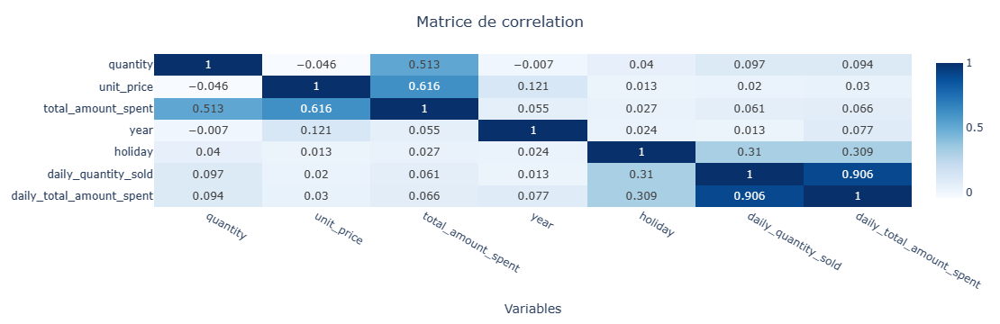

In [58]:
# Create a heatmap using Plotly Express
fig_corr = px.imshow(matrix_correlation, 
                color_continuous_scale='Blues', 
                aspect="auto",
                text_auto=True,
                labels=dict(x="Variables", y=""))
fig_corr.update_layout(
    title={
        'text': "Matrice de correlation",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

Comme nous pouvons voir dans le heatmap ci-dessus, les variables **daily_quantity_sold** et **daily_total_amount_spent** sont très corrélées entre elle. Cela est du au fait que ce 2 variables dépendent des meme variables, c'est-à-dire **quantity** et **unit_price**.

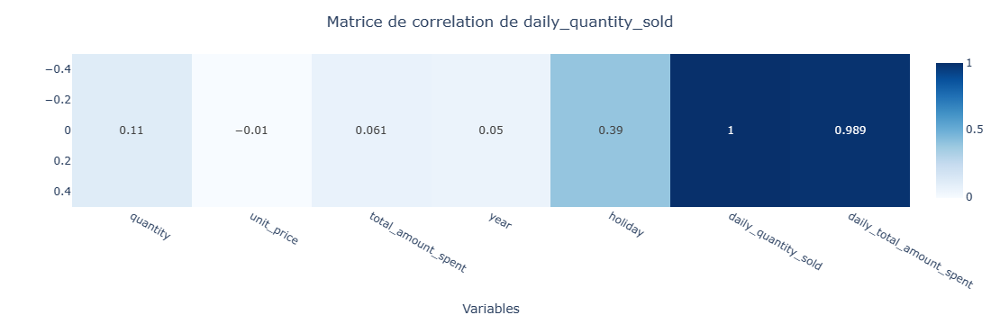

In [59]:
matrix_correlation_target = round(df_bakery.corrwith(df_bakery['daily_quantity_sold']), 3)

# Create a heatmap using Plotly Express
fig_corr_target = px.imshow(matrix_correlation_target.to_frame().T, 
                color_continuous_scale='Blues', 
                aspect="auto",
                text_auto=True,
                labels=dict(x="Variables", y=""))
fig_corr_target.update_layout(
    title={
        'text': "Matrice de correlation de daily_quantity_sold",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

### 4.4. Préparation spécifique au Prophet

In [60]:
# Création de la base de modélisation Prophet
df_modelisation_prophet=df_bakery[["date", "article", "quantity"]]

In [61]:
# Affichage de TOP 5 articles vendus 
df_modelisation_prophet.groupby("article")["quantity"].sum().reset_index().sort_values("quantity", ascending=False).head(6)

,article,quantity
139,TRADITIONAL BAGUETTE,118003
31,CROISSANT,29800
84,PAIN AU CHOCOLAT,25350
6,BANETTE,22857
30,COUPE,22722
3,BAGUETTE,22145


In [62]:
# Creation d'une liste qui contient les top 5 articles (nous avons enlevé COUPE car c'est un service et non un article)
list_top5=["TRADITIONAL BAGUETTE", "CROISSANT", "PAIN AU CHOCOLAT", "BANETTE", "BAGUETTE"]

In [63]:
# Filtrage du dataframe pour la modèlisation pour avoir seuelement le top 5 articles
df_prophet= df_modelisation_prophet[df_modelisation_prophet["article"].isin(list_top5)]

In [64]:
# Aggregation par date et article pour avoir la quantité vendues par jour
df_prophet = df_prophet.groupby(["date", "article"])["quantity"].sum().reset_index()

In [65]:
# Nous allons limiter notre dataframe à la date que nous avions au depart (2022-09-30) car l'aggrefation créer des dates en plus
last_date='2022-09-30'
df_prophet = df_prophet[df_prophet["date"] <= last_date]

In [66]:
# On renomme les colonnes pour la modèlisation
df_prophet.rename(columns={"date": "ds", "quantity": "y"}, inplace=True)
df_prophet = df_prophet[["article", "ds", "y"]]

In [68]:
# Affichage du dataframe pour la modélisation
df_prophet.head()

,article,ds,y
0,BAGUETTE,2021-01-02,15
1,BANETTE,2021-01-02,20
2,CROISSANT,2021-01-02,6
3,PAIN AU CHOCOLAT,2021-01-02,14
4,TRADITIONAL BAGUETTE,2021-01-02,72


In [69]:
# Séparation des données en échantillon de train et de test
train_pro = df_prophet[:int(0.7*len(df_prophet))]
test_pro = df_prophet[int(0.7*len(df_prophet)):]

In [70]:
# Création de la base de modélisation pour les vacances Prophet
df_bakery['holiday'] = df_bakery['holiday'].replace({0: 'Pas Vacances', 1: 'Vacances'})
holidays=df_bakery.groupby("date")["holiday"].first().reset_index()

In [71]:
# Nous allons limiter notre dataframe à la date que nous avions au depart (2022-09-30) car l'aggrefation créer des dates en plus
last_date='2022-09-30'
holidays = holidays[holidays["date"] <= last_date]

In [72]:
#On renomme les colonnes pour la modèlisation
holidays.rename(columns={"date": "ds"}, inplace=True)

In [73]:
#Affichage du dataframe pour la modélisation des vacances
holidays.head()

,ds,holiday
0,2021-01-02,Vacances
1,2021-01-03,Vacances
2,2021-01-04,Pas Vacances
3,2021-01-05,Pas Vacances
4,2021-01-06,Pas Vacances


#  5. Sélection de différents modèles
---


### A - Critères de sélection

---
Dans le cadre de la prévision des quantités vendues au sein de notre boulangerie, nous avons choisi d'implémenter deux algorithmes : 
- Un **Gradient Boosting** est dans notre cadre un bon choix pour la prévision des quantités vendues au sein de notre boulangerie  car il peut **gérer des relations non linéaires**, incorporer des caractéristiques externes, gérer des données manquantes, est robuste aux valeurs aberrantes et est une méthode d'ensemble qui combine les prédictions de plusieurs modèles faibles pour produire une prédiction forte.

- Un modèle **SARIMAX** (Seasonal AutoRegressive Integrated Moving Average with Exogenous variables) : une extension du modèle ARIMA  qui prédit les valeurs futures d'une série temporelle sur certains aspect de la structure statistique de la série à savoir sa partie **autorégressive** (AR) et de ses **moyennes glissantes** (MA). A l'inverse du modèle ARIMA, le **SARIMAX prend en compte la saisonnalité présente dans les séries** ce qui la rend d'autant plus intéréssante dans notre cadre d'étude de prévision des quantités vendues au sein de la boulangerie. De plus, ce modèle peut intégrer des variables explicatives supplémentaires (facteurs externes) susceptibles d'avoir un impact sur la série temporelle, comme par exemple les données météorologiques.

- Un  **Prophet** qui est un algorithme populaire de forecast de séries temporelles développé par Facebook.  Il s’agit d’un **modèle de régression additive qui inclut les effets de tendance, de saisonnalité et de vacances, ainsi que des régresseurs supplémentaires, pour faire des prévisions**. Dans notre cadre, il est intéréssant de l'implémenter car il permet de faire des **prédictions à haute accuracy** tout en laissant une **bonne interprétabilité** du modèle à ses utilisateurs. De plus, son **horizon de prévision est très  long et flexible** selon les besoins de l'utilisateur.




### B - Choix de la métrique
---
Afin d'évaluer les performances de notre modèle, étant dans un cadre de prévision d'une quantité nous avons choisi comme métrique la **MAPE (mean absolute percentage error)** mesure la **différence en pourcentage entre les valeurs prévues et réelles, ce qui est une mesure pertinente pour évaluer les modèles de prévision dans des contextes commerciaux**.

<h1> <center> Gradient Boosting <center> <h1>

- - - 

In [74]:
# Initialialisation du modèle
gb = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

In [75]:
# Entraîement du modèle
gb.fit(X_train_gb, y_train)

GradientBoostingRegressor(random_state=42)

In [76]:
# Prédiction sur l'échantillon de test
y_pred = gb.predict(X_test_gb)

In [77]:
# Calcul de la métrique MAPE
mape = mean_absolute_percentage_error(y_test, y_pred)
print('MAPE:', mape)

MAPE: 0.10288531243499602


Un **MAPE de 0.10288531243499602 indique qu’en moyenne, les prédictions du modèle sont d’environ 10,29% inférieures aux valeurs réelles**. Par exemple, si la quantité quotidienne réelle vendue est de 100, la prédiction du modèle serait, en moyenne, distante de 9,03 % de la valeur réelle, qui est d’environ 9,03 unités.

In [78]:
# Stockage des prédictions dans un dataframe
predictions = pd.DataFrame({'date': test_gb.index, 'actual_quantity' : test_gb['daily_quantity_sold'],'prediction_quantity': y_pred})

In [79]:
# On met la date en index
predictions.set_index('date',inplace=True)

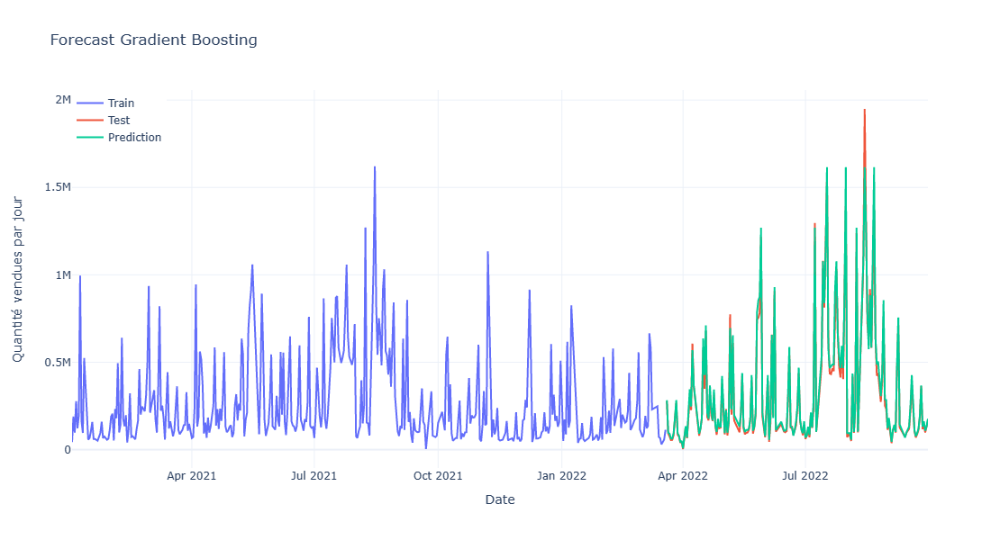

In [81]:
# Graphique des prédictions
trace_train = go.Scatter(x=train_gb.index, y=train_gb['daily_quantity_sold'], name='Train')
trace_test = go.Scatter(x=test_gb.index, y=test_gb['daily_quantity_sold'], name='Test')
trace_pred = go.Scatter(x=predictions.index, y=predictions['prediction_quantity'], name='Prediction')
layout = go.Layout(title='Forecast Gradient Boosting', 
                   xaxis=dict(title='Date'),
                   yaxis=dict(title='Quantité vendues par jour'),
                   legend=dict(x=0, y=1),
                   template='plotly_white')
fig = go.Figure(data=[trace_train, trace_test, trace_pred], layout=layout)
fig.update_layout(width=1200, height=600, template='plotly_white')
fig.show()

On peut voir à travers le graphique ci-dessus que **les prédictions de notre modèle de Gradient Boosting sont plutôt très précises** car elles collent aux valeurs réelles de l'échantillon de test.

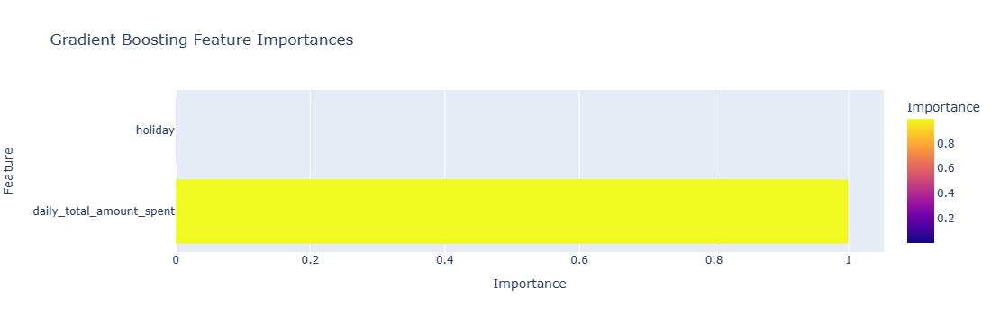

In [82]:
# Graphique de l'importance de chaque features dans le modèle 
importances = gb.feature_importances_
feature_importances = pd.DataFrame({'feature': X_train_gb.columns, 'importance': importances})
feature_importances = feature_importances.sort_values('importance', ascending=False)
fig = px.bar(feature_importances, x='importance', y='feature',
             labels={'feature': 'Feature', 'importance': 'Importance'},
             title='Gradient Boosting Feature Importances',
             orientation='h', color='importance')
fig.update_layout(xaxis=dict(title='Importance'))
fig.show()

On peut voir que la variable qui contribue le plus à la prédiction des ventes journalières est : **daily_total_amount_spent** correspondant au montant journalier dépensé par les clients au sein de la boulangerie. L'influence de la variable **'holiday'** est comme on peut le voir minime malgré l'idée qu'on pourrait avoir de son importance.

<h1> <center> SARIMAX <center> <h1>

- - - 

In [ ]:
## Détermination automatique de l'ordre à retenir : AUTO - arima
#model_auto_arima = auto_arima(train_sarima['daily_quantity_sold'], trace=True,start_p=0, start_q=0, start_P=0, start_Q=0,
                # max_p=5, max_q=5, max_P=3, max_Q=3, seasonal=True,maxiter=10,m = 52, D = 1,
                 # error_action='ignore',approximation = False)
#model_auto_arima.fit(train_sarima)

In [83]:
# Entraînement du modèle SARIMA
model = SARIMAX(endog=train_sarima,
            enforce_stationarity=False,
            enforce_invertibility=False, order=(3,0,0), seasonal_order=(3,1,1,30))
model_fit = model.fit()

In [84]:
# Prédiction sur le jeu de test
prediction_sarimax = pd.DataFrame(model_fit.predict(start= len(train_sarima), end=(len(train_sarima) + len(test_sarima) - 1))).set_index(test_sarima.index)


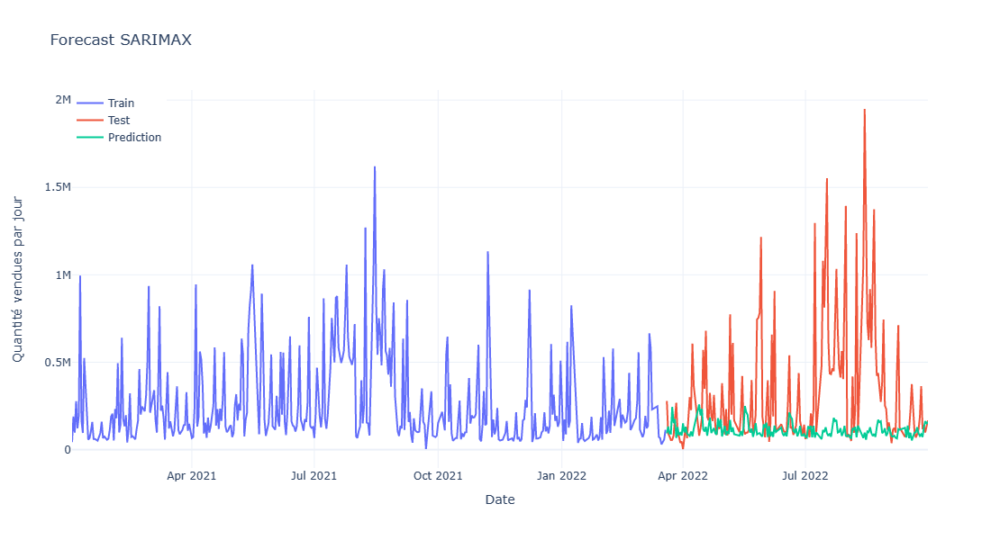

In [85]:
# Graphique des prédictions
trace_train = go.Scatter(x=train_sarima.index, y=train_sarima['daily_quantity_sold'], name='Train')
trace_test = go.Scatter(x=test_sarima.index, y=test_sarima['daily_quantity_sold'], name='Test')
trace_pred = go.Scatter(x=prediction_sarimax.index, y=prediction_sarimax["predicted_mean"], name='Prediction')
layout = go.Layout(title='Forecast SARIMAX', 
                   xaxis=dict(title='Date'),
                   yaxis=dict(title='Quantité vendues par jour'),
                   legend=dict(x=0, y=1),
                   template='plotly_white')
fig = go.Figure(data=[trace_train, trace_test, trace_pred], layout=layout)
fig.update_layout(width=1200, height=600, template='plotly_white')
fig.show()

In [86]:
# Evaluation du modèle à l'aide de la MAPE
mape_sarima = mean_absolute_percentage_error(test_sarima, prediction_sarimax["predicted_mean"])
print('MAPE:', mape_sarima)

MAPE: 0.84807695573357


Un **MAPE de 0.848 indique qu’en moyenne, les prédictions du modèle sont d’environ 85% inférieures aux valeurs réelles**.

Comme affiché dans le graphique ci-dessus,  on peut donc voir qu'ils n'arrivent pas à bien prédire les quantités vendues, nous pensons que cela est dû au fait que nous avons sélectionné les paramètres du modèle SARIMA à l'aide de l'autocorrélation partielle du fait d'un manque de ressource (RAM) pour effectuer une sélection automatique des paramètres optimaux ce qui a sûrement conduit aux sous performances du modèle.

<h1> <center> PROPHET <center> <h1>

- - - 

________________________________________________________________________________
TRADITIONAL BAGUETTE
________________________________________________________________________________
MAPE = 0.3690891751211554


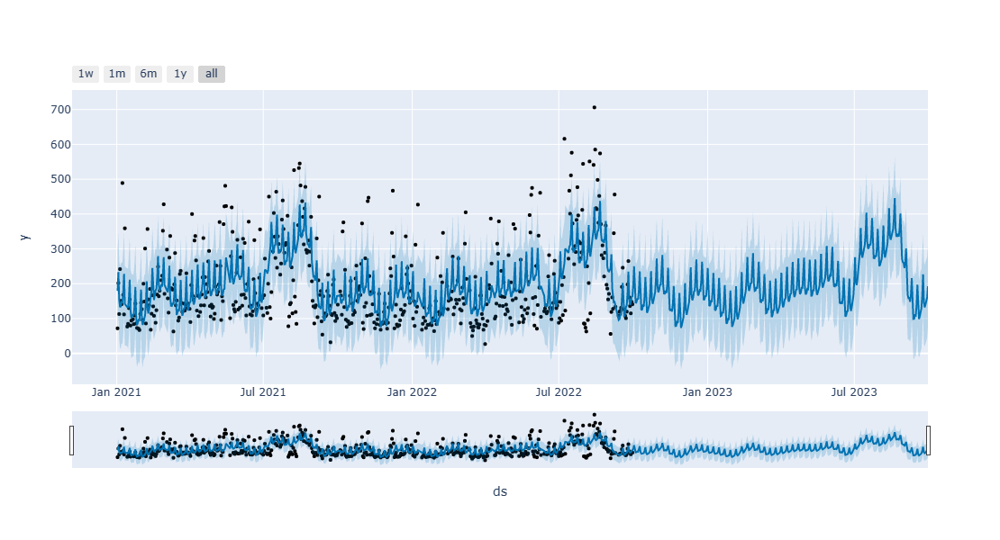

________________________________________________________________________________
CROISSANT
________________________________________________________________________________
MAPE = 0.46467029577361885


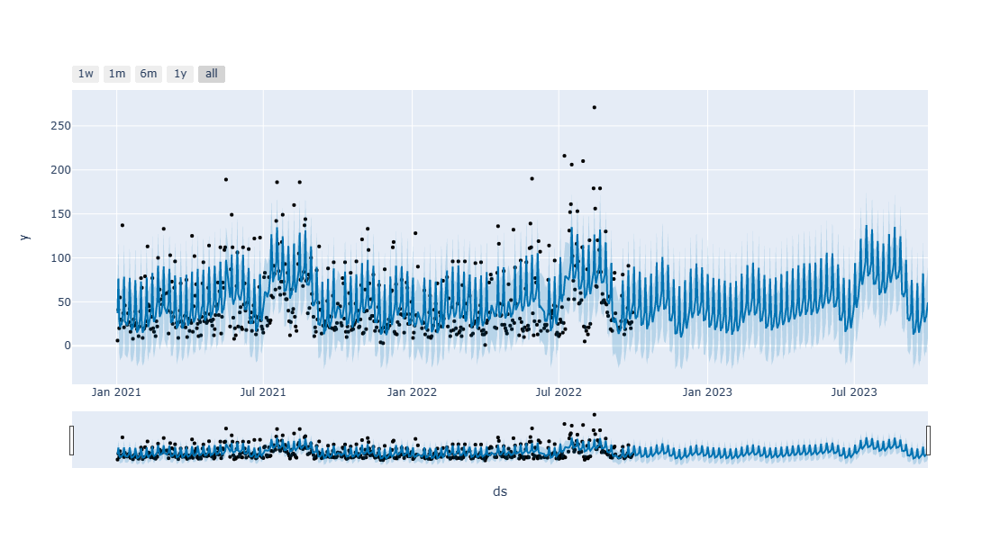

________________________________________________________________________________
PAIN AU CHOCOLAT
________________________________________________________________________________
MAPE = 0.3085507950946724


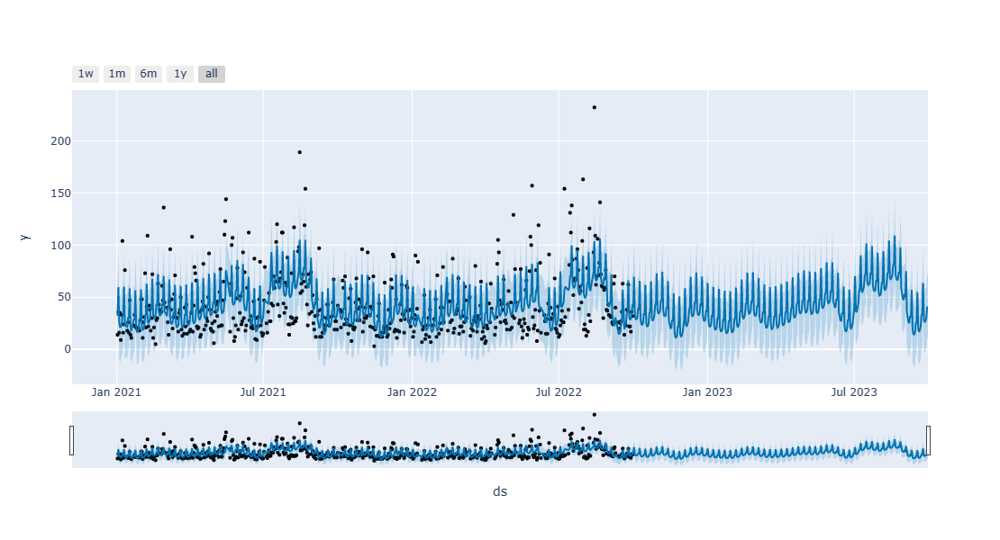

________________________________________________________________________________
BANETTE
________________________________________________________________________________
MAPE = 0.3165214541691617


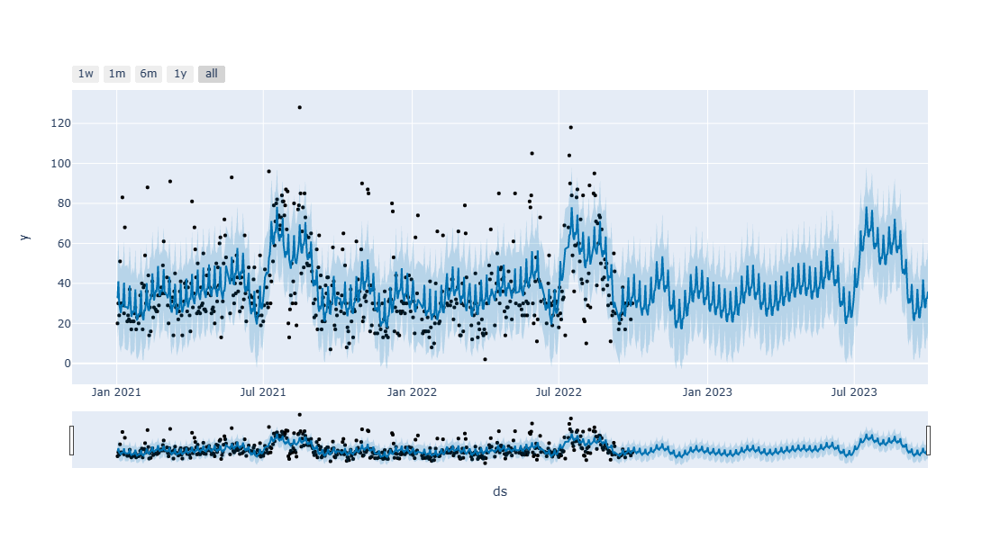

________________________________________________________________________________
BAGUETTE
________________________________________________________________________________
MAPE = 0.3873866906511934


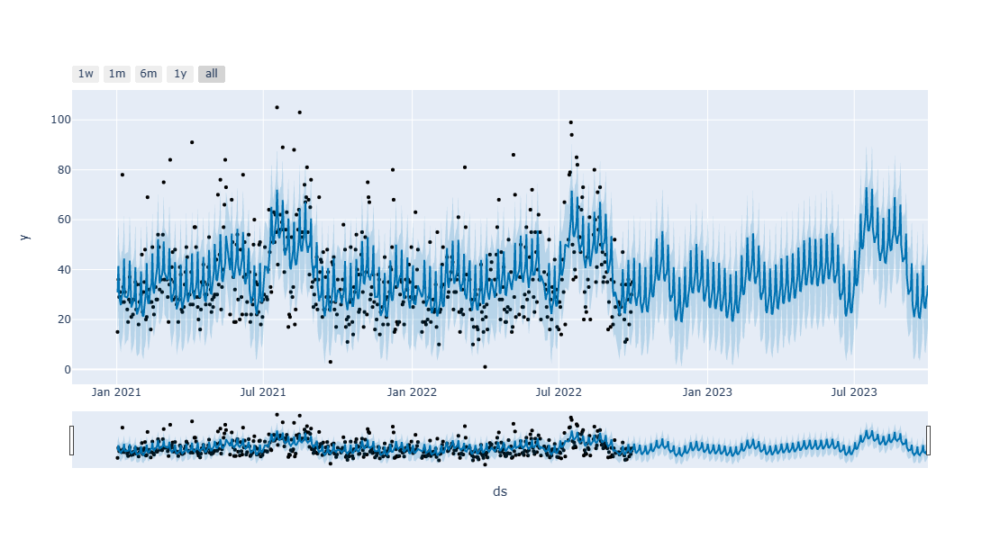

In [87]:
start_date = "2022-9-1"
end_date = "2022-9-30"

for article in list_top5:
    # Dataframe filtré par article 
    df_model = df_prophet[df_prophet["article"] == article]
    
    # Configuration des parametres du modèle
    model = Prophet(holidays=holidays,
                yearly_seasonality=True,
                weekly_seasonality=True,
                daily_seasonality=True,
                interval_width=0.80,
                growth="flat",
                seasonality_mode="multiplicative")
    # Fit du modèle 
    model.fit(df_model)
    
    # Forecast 1 an
    future = model.make_future_dataframe(periods=365)
    forecast = model.predict(future)
    forecast["article"] = article
    
    # Periode de temps 1 mois
    actual = df_model[(df_model["ds"] >= start_date) & (df_model["ds"] <= end_date)]
    pred = forecast[(forecast["ds"] >= start_date) & (forecast["ds"] <= end_date)]
    
    mape = mean_absolute_percentage_error(actual.sort_values("ds")["y"], pred["yhat"])
    print("_"*80)
    print(article)
    print("_"*80)
    print(f"MAPE = {mape}")
   
    # Affichage du graphique 
    plot_plotly(model, forecast).show()
    

Nous constater que le modèle de deep learning **Prophet**, n'arrive pas de manière générale, à bien prédire la série. Nous pouvons voir que les **MAPE** respectives pour les différent articles sont :

* TRADITIONAL BAGUETTE : MAPE = 0.369
* CROISSANT : MAPE = 0.465
* PAIN AU CHOCOLAT : MAPE = 0.309
* BANETTE : MAPE = 0.317
* BAGUETTE : MAPE = 0.387

# 6. Evaluation des performances des modèles sur différents horizons de prédictions
---

<h1> <center> Gradient Boosting <center> <h1>

- - - 

In [88]:
predictions.index = pd.to_datetime(predictions.index)

In [89]:
monthly_predictions = predictions.resample('M').sum()

In [90]:
mape_by_month = ((monthly_predictions['actual_quantity'] - monthly_predictions['prediction_quantity']).abs() / monthly_predictions['prediction_quantity']).mean()

In [91]:
monthly_mape = predictions.groupby(pd.Grouper(freq='M')).apply(lambda x: (abs(x['actual_quantity'] - x['prediction_quantity']) / x['actual_quantity']).mean())

# add monthly_mape to monthly_predictions dataframe
monthly_predictions['MAPE'] = monthly_mape.values

In [92]:
monthly_predictions

,actual_quantity,prediction_quantity,MAPE
date,,,
2022-03-31,1329455,1.424035e+06,0.095611
2022-04-30,6081106,6.571730e+06,0.154489
2022-05-31,8335214,8.896866e+06,0.106993
2022-06-30,5906850,6.232866e+06,0.087476
2022-07-31,16474159,1.727571e+07,0.078700
2022-08-31,15585594,1.629401e+07,0.109183
2022-09-30,4391516,4.721375e+06,0.084949


Nous pouvons voir que **notre métrique par mois produit des résultats assez satisfaisant en termes de pourcentage d'erreur par rapport aux valeurs réelles**. Cela nous conforte dans les performances de notre modèle à différents horizons donnés.

<h1> <center> SARIMAX <center> <h1>

- - - 

In [93]:
# Transformation des dates en mensuel pour le test SARIMAX
test_sarima_month= test_sarima.resample('M').sum()

In [94]:
# Transformation des dates en mensuel pour les predictions SARIMAX
predictions_sarimax_month = prediction_sarimax.resample('M').sum()

In [95]:
# Concatenation des 2 fichiers ci dessus pour calculer la MAPE mensuelle
monthly_predictions_sarimax=pd.merge(test_sarima_month, predictions_sarimax_month, left_index=True, right_index=True)

In [96]:
# Calcul MAPE mensuelle
monthly_mape_sarimax = monthly_predictions_sarimax.groupby(pd.Grouper(freq='M')).apply(lambda x: (abs(x['daily_quantity_sold'] - x['predicted_mean']) / x['daily_quantity_sold']).mean())

# Ajout de la MAPE mensuelle au dataframe des predictions SARIMAX
monthly_predictions_sarimax['MAPE'] = monthly_mape_sarimax.values

In [97]:
monthly_predictions_sarimax

,daily_quantity_sold,predicted_mean,MAPE
date,,,
2022-03-31,1329455,1.434548e+06,0.079049
2022-04-30,6081106,3.356914e+06,0.447976
2022-05-31,8335214,3.193176e+06,0.616905
2022-06-30,5906850,3.044382e+06,0.484601
2022-07-31,16474159,2.997343e+06,0.818058
2022-08-31,15585594,2.872295e+06,0.815708
2022-09-30,4391516,2.532446e+06,0.423332


Comme on peut le voir ci-dessus, **la MAPE au mois de Mars donne de meilleurs résultats que celles des mois suivant avec une MAPE respective de 7%**. **Ce bon résultat se dégrade dès le mois suivant où on atteint une MAPE de 82% au mois d'Août ce qui montre que l'on se trompe totalement dans les prédictions du modèle pour les mois suivants celui de Mars**.

# 7. Discussion autour des performances des modèles
---

### GRADIENT BOOSTING
---

Comme on peut le voir dans les sections précédentes, le modèle de Gradient Boosting est celui qui performe le mieux en terme de métrique. Il donne des résultats satisfaisants ce qui témoigne de la performance du modèle de Gradient Boosting.

### SARIMAX
---

Les mauvaises performances du modéle SARIMAX peuvent provenir de différentes raisons. Une première raison est la mauvaise spécification des ordres et des hyperparamètres dans le modèlele et il n'est pas en mesure de capturer la saisonnalité ou d'autres modèles importants dans les données. Une autre raison  peut etre du aux valuers aberrantes ou aux événements inattendus comme nous pouvons voir à cause de certains pics à certaines dates (par exemple juillet et aout), donc le modèle n'arrive pas à capter ces situations et donc il peut produire des prévisions inexactes.

Pour améliorer les performances de prévision du modèle SARIMAX, nous aurions pu ajuster les hyperparamètres du modèle à travers une librarie qui s'appelle **auto_arima** mais cela était très couteau en temps de calcul et nous avons été confrontée à un problème de memoire RAM lorsque le l'entrainement. Ou bien, nous aurions pu normaliser les données pour le pas avoir les valeurs aberrantes.


Toutefois, nous pouvons constater que pour un horizon court de temps (1 mois), les prévions ne sont pas mauvaise. En effet, dans le tableau ci-dessus, nous pouvons voir que pour le mois de mars 2022, la MAPE pour le modèle SARIMAX s'eleve à 0,079. Cela signifie qu’en moyenne, les prédictions du modèle sont d’environ 7,9% inférieures aux valeurs réelles.

### PROPHET
---

Concernant le modèle **Prophet**, nous évaluons ici la prévision des quantités journalières vendues par article notamment les 5 articles les plus vendues au sein de la boulangerie.
Comparé à ses modèles pairs qui eux prévoit la quantité journalière vendue globale, il semble bien performer compte tenu des effets saisonniers et temporelles que comportent les ventes d'articles spécifiques.

# 8. Synthèse et conclusion, pistes d'améliorations
---

En somme, ce projet de modélisation des quantités vendues au sein de la boulangerie nous a permis de manipuler des séries temporelles et d'appréhender les concepts inhérents à la tendance et la saisonnalité propres aux séries temporelles.

Il nous a également permis d'évaluer les performances de modèles divers telles que de machine learning avec le gradient boosting  plus statistiques comme le SARIMA et le Prophet.
Plusieurs constats peuvent être tirer à l'issue de l'évaluation des performances respectives des modèles implémentés : 
- Les performances des modèles aurait pu être meilleur si à l'aide d'un historique plus riche, nous avions effectué des prédictions mensuelles voire hebdomadaire car cela donne une meilleure idée de la tendance des ventes au sein de la boulangerie. Ces performances mensuelles améliorées ont notamment été visibles sur les différents modèles tels que SARIMA et Gradient Boosting où notre métrique est meilleure mensuellement.
- Le modèle de Gradient Boosting performe globalement mieux que les autres modèles selon nous car il n'inclue pas comme les autres modèles les notions de tendance ou de saisonnalité pouvant bruiter les prédictions.
- Les prédicitions par type d'article comme nous l'avons fait dans le Prophet ne donne pas de bonnes prédictions mais celles-ci sont encourageantes quant à la précision que peut avoir le modèle Prophet sur un grand historique de données.



Comme pistes d'améliorations nous aurons : 
- Dans un premier temps pu optimiser nos modèles à l'aide de la recherche des hyperparamètres optimaux à l'aide d'algorithme comme le *gridsearchCV* pour le gradient boosting ou le  *RandomizedSearchCV* pour le prophet.
- Dans un second temps, *nous aurions pu inclure dans notre modèle des informations sur la température journalière* qui influe sur les articles vendues en boulangerie.
- Egalement, nous aurions pu inclure en plus des périodes de vacances, les jours fériés afin d'enrichir notre connaissance des comportements des clients de la boulangerie.

In [102]:
# Récupération des requirements du notebook
!pip freeze > requirements.txt